# **ルワンダにおける CO2 排出量を予測する**
Predict CO2 Emissions in Rwanda(https://www.kaggle.com/competitions/playground-series-s3e20)

# 参考資料
**書籍**


**Kaggle**
- [Getting Started: EDA](https://www.kaggle.com/code/inversion/getting-started-eda)

**記事**

**自分で作成したファイル**
- モース硬度データセットを使用した回帰
- 生体信号を使用した喫煙者の状態のバイナリ予測
- ソフトウェア欠陥データセットによるバイナリ分類
- 肝硬変の転帰の多クラス予測
- タイタニック_災害からの機械学習
- Home Credit Default Risk
- 馬の健康への影響を予測する

**その他**

## 概要
1. 目的：
2. 目次:
    * ライブラリ・データセットのインポート
    * EDA
3. データセット:
4. 目的変数： 'emission'

5. コンペのゴール
    -


### 各特徴量の日本語訳



#### 評価指標： RMSE


# ライブラリ・データセットのインポート

In [1]:
!pip install sweetviz
!pip install category_encoders
!pip install geopandas folium

In [2]:
import pandas as pd
import numpy as np
from scipy import stats
from scipy.stats import norm, skew

import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
from IPython.display import display
import sweetviz as sv

import warnings; warnings.filterwarnings("ignore")

pd.options.display.float_format = '{:.5f}'.format
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
plt.style.use('ggplot')

In [3]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform
import missingno as msno

from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor # 特徴量の重要度評価で用いる

# 敵対性の検証で用いる
from category_encoders import OneHotEncoder
from sklearn.model_selection import  StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.pipeline import make_pipeline
from xgboost import XGBClassifier

In [4]:
# 地図情報を出力する
import geopandas as gpd
from shapely.geometry import Point
import folium

## 実行時間を調べるために使う

In [5]:
import datetime
import time
import math

start_time = time.time()

def changeHMS(s):
    h = math.floor(s / 3600)
    if h > 0:
        s = s - h * 3600
        indi_h = str(h) + 'h'
    else:
        indi_h = ''
    m = math.floor(s / 60)
    if m > 0:
        indi_m = str(m) + 'm'
    else:
        indi_m = ''
    s = math.floor(s % 60)
    time = indi_h + indi_m + str(s) + 's'
    return time

In [6]:
FILE_PATH = ''
OUTPUT_DIR = ''

train = pd.read_csv(FILE_PATH + 'train.csv')
test = pd.read_csv(FILE_PATH + 'test.csv')

## id と目的変数の分割

In [7]:
# train_id = train['id']
# train.drop('id', axis=1, inplace=True)

# test_id = test['id']
# test.drop('id', axis=1, inplace=True)

target = train['emission']
target_col = 'emission'

target_name = str(train.iloc[:, [-1]].columns.tolist())
print(target_name)

['emission']


## データ(DataFrame)の構成を調べる

In [8]:
train.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,UvAerosolLayerHeight_aerosol_height,UvAerosolLayerHeight_aerosol_pressure,UvAerosolLayerHeight_aerosol_optical_depth,UvAerosolLayerHeight_sensor_zenith_angle,UvAerosolLayerHeight_sensor_azimuth_angle,UvAerosolLayerHeight_solar_azimuth_angle,UvAerosolLayerHeight_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,ID_-0.510_29.290_2019_00,-0.51000,29.29000,2019,0,-0.00011,0.60302,-0.00007,0.25567,-98.59389,50.84356,-130.05080,35.87450,-0.00003,0.03537,1589.02454,4061.09814,829530.50000,71.11198,52.77593,-149.87556,25.96521,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00012,0.86323,0.00004,0.25567,35.87450,-130.05080,50.84356,-98.59389,-1.28076,829864.54688,-12.62898,35.63242,-138.78645,30.75213,0.11593,2.50661,0.29566,225.73114,0.59547,-12.62898,35.63242,-138.78645,30.75213,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.59547,53534.73242,3664.43622,61085.80957,2615.12048,15.56853,0.27229,-12.62899,35.63242,-138.78642,30.75214,3.75099
1,ID_-0.510_29.290_2019_01,-0.51000,29.29000,2019,1,0.00002,0.72821,0.00001,0.13099,16.59286,39.13719,-140.87443,28.96513,0.00001,0.03653,1772.57441,1869.04041,829787.28713,-1.01959,38.98237,-140.15805,29.56200,0.00005,0.00002,0.00003,0.00009,7311.86914,-1.93539,0.06704,829859.96037,5.47104,35.26519,-138.34391,30.05426,0.00017,1.17283,0.00014,0.20075,29.07178,-141.81483,43.05021,4.67884,-1.54812,829747.85697,16.15249,43.48533,-142.78614,28.57363,0.11678,2.65770,0.31573,226.17217,0.17517,24.46434,42.59654,-143.09787,28.21366,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.21361,63790.29624,3651.19031,66969.47873,3174.57242,8.69060,0.25683,30.35938,39.55763,-145.18393,27.25178,4.02518
2,ID_-0.510_29.290_2019_02,-0.51000,29.29000,2019,2,0.00051,0.74820,0.00038,0.11002,72.79584,52.86882,-150.19176,23.20642,0.00015,0.03534,2703.23680,2809.13839,829883.82869,-54.80114,52.34438,

In [9]:
test.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,UvAerosolLayerHeight_aerosol_height,UvAerosolLayerHeight_aerosol_pressure,UvAerosolLayerHeight_aerosol_optical_depth,UvAerosolLayerHeight_sensor_zenith_angle,UvAerosolLayerHeight_sensor_azimuth_angle,UvAerosolLayerHeight_solar_azimuth_angle,UvAerosolLayerHeight_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle
0,ID_-0.510_29.290_2022_00,-0.51000,29.29000,2022,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.56152,829937.00000,-100.11378,33.69696,-133.04756,33.77957,0.11218,2.37489,0.26985,227.19310,0.48534,-100.11378,33.69696,-133.04756,33.77957,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.48513,36022.02734,8472.31348,41047.93750,7472.31348,7.93562,0.24077,-100.11379,33.69704,-133.04755,33.77958
1,ID_-0.510_29.290_2022_01,-0.51000,29.29000,2022,1,0.00046,0.69116,0.00032,0.00000,76.23920,15.60061,-140.52985,28.89612,0.00016,0.03764,1688.65634,2814.30968,829652.95760,26.07217,25.18955,-142.61264,28.31892,0.00005,0.00001,0.00004,0.00009,7311.86914,-1.41631,0.03677,829736.12500,76.23920,15.60061,-140.52985,28.89612,0.00012,0.95710,0.00006,0.00000,28.89612,-140.52985,15.60061,76.23920,-0.82366,829753.05134,-0.01000,34.74554,-139.17104,30.40507,0.11264,2.53731,0.29018,228.48922,0.51568,-0.01000,34.74554,-139.17104,30.40507,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.71126,48539.73724,6476.14732,54915.70858,5476.14716,11.44844,0.29312,-30.51032,42.40259,-138.63282,31.01238
2,ID_-0.510_29.290_2022_02,-0.51000,29.29000,2022,2,0.00016,0.60511,0.00011,0.07987,-42.05534,39.88906,-136.90898,30.05468,0.00005,0.03780,2629.69209,3233.65497,829589.97162,14.88126,40.83358,-143.94934,26.76022,0.00006,0.00002,0.00004,0.00011,8613.42642,-0.00810,0.03649,829922.56250,-99.81684,36.69316,-131.65806,32.78489,0.00028,0.76455,0.000

In [10]:
print('train: ')
print(train.shape)
print(train.info())
print('\n')
print('test: ')
print(test.shape)
print(test.info())

train: 
(79023, 76)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79023 entries, 0 to 79022
Data columns (total 76 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   ID_LAT_LON_YEAR_WEEK                                      79023 non-null  object 
 1   latitude                                                  79023 non-null  float64
 2   longitude                                                 79023 non-null  float64
 3   year                                                      79023 non-null  int64  
 4   week_no                                                   79023 non-null  int64  
 5   SulphurDioxide_SO2_column_number_density                  64414 non-null  float64
 6   SulphurDioxide_SO2_column_number_density_amf              64414 non-null  float64
 7   SulphurDioxide_SO2_slant_column_number_density            64414 non-null  float64
 

In [11]:
train_columns = train.columns
train_index = train.index
train_data = train.values # values

test_columns = test.columns
test_index = test.index
test_data = test.values # values

print('train: ')
print(type(train_columns))
print(type(train_index))
print(type(train_data))
print('\n')
print('test: ')
print(type(test_columns))
print(type(test_index))
print(type(test_data))

train: 
<class 'pandas.core.indexes.base.Index'>
<class 'pandas.core.indexes.range.RangeIndex'>
<class 'numpy.ndarray'>


test: 
<class 'pandas.core.indexes.base.Index'>
<class 'pandas.core.indexes.range.RangeIndex'>
<class 'numpy.ndarray'>


In [12]:
with pd.option_context('display.max_rows', 8):
    display(train)

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,UvAerosolLayerHeight_aerosol_height,UvAerosolLayerHeight_aerosol_pressure,UvAerosolLayerHeight_aerosol_optical_depth,UvAerosolLayerHeight_sensor_zenith_angle,UvAerosolLayerHeight_sensor_azimuth_angle,UvAerosolLayerHeight_solar_azimuth_angle,UvAerosolLayerHeight_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,ID_-0.510_29.290_2019_00,-0.51000,29.29000,2019,0,-0.00011,0.60302,-0.00007,0.25567,-98.59389,50.84356,-130.05080,35.87450,-0.00003,0.03537,1589.02454,4061.09814,829530.50000,71.11198,52.77593,-149.87556,25.96521,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00012,0.86323,0.00004,0.25567,35.87450,-130.05080,50.84356,-98.59389,-1.28076,829864.54688,-12.62898,35.63242,-138.78645,30.75213,0.11593,2.50661,0.29566,225.73114,0.59547,-12.62898,35.63242,-138.78645,30.75213,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.59547,53534.73242,3664.43622,61085.80957,2615.12048,15.56853,0.27229,-12.62899,35.63242,-138.78642,30.75214,3.75099
1,ID_-0.510_29.290_2019_01,-0.51000,29.29000,2019,1,0.00002,0.72821,0.00001,0.13099,16.59286,39.13719,-140.87443,28.96513,0.00001,0.03653,1772.57441,1869.04041,829787.28713,-1.01959,38.98237,-140.15805,29.56200,0.00005,0.00002,0.00003,0.00009,7311.86914,-1.93539,0.06704,829859.96037,5.47104,35.26519,-138.34391,30.05426,0.00017,1.17283,0.00014,0.20075,29.07178,-141.81483,43.05021,4.67884,-1.54812,829747.85697,16.15249,43.48533,-142.78614,28.57363,0.11678,2.65770,0.31573,226.17217,0.17517,24.46434,42.59654,-143.09787,28.21366,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.21361,63790.29624,3651.19031,66969.47873,3174.57242,8.69060,0.25683,30.35938,39.55763,-145.18393,27.25178,4.02518
2,ID_-0.510_29.290_2019_02,-0.51000,29.29000,2019,2,0.00051,0.74820,0.00038,0.11002,72.79584,52.86882,-150.19176,23.20642,0.00015,0.03534,2703.23680,2809.13839,829883.82869,-54.80114,52.34438,

In [13]:
with pd.option_context('display.max_rows', 8):
    display(test)

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,SulphurDioxide_solar_azimuth_angle,SulphurDioxide_solar_zenith_angle,SulphurDioxide_SO2_column_number_density_15km,CarbonMonoxide_CO_column_number_density,CarbonMonoxide_H2O_column_number_density,CarbonMonoxide_cloud_height,CarbonMonoxide_sensor_altitude,CarbonMonoxide_sensor_azimuth_angle,CarbonMonoxide_sensor_zenith_angle,CarbonMonoxide_solar_azimuth_angle,CarbonMonoxide_solar_zenith_angle,NitrogenDioxide_NO2_column_number_density,NitrogenDioxide_tropospheric_NO2_column_number_density,NitrogenDioxide_stratospheric_NO2_column_number_density,NitrogenDioxide_NO2_slant_column_number_density,NitrogenDioxide_tropopause_pressure,NitrogenDioxide_absorbing_aerosol_index,NitrogenDioxide_cloud_fraction,NitrogenDioxide_sensor_altitude,NitrogenDioxide_sensor_azimuth_angle,NitrogenDioxide_sensor_zenith_angle,NitrogenDioxide_solar_azimuth_angle,NitrogenDioxide_solar_zenith_angle,Formaldehyde_tropospheric_HCHO_column_number_density,Formaldehyde_tropospheric_HCHO_column_number_density_amf,Formaldehyde_HCHO_slant_column_number_density,Formaldehyde_cloud_fraction,Formaldehyde_solar_zenith_angle,Formaldehyde_solar_azimuth_angle,Formaldehyde_sensor_zenith_angle,Formaldehyde_sensor_azimuth_angle,UvAerosolIndex_absorbing_aerosol_index,UvAerosolIndex_sensor_altitude,UvAerosolIndex_sensor_azimuth_angle,UvAerosolIndex_sensor_zenith_angle,UvAerosolIndex_solar_azimuth_angle,UvAerosolIndex_solar_zenith_angle,Ozone_O3_column_number_density,Ozone_O3_column_number_density_amf,Ozone_O3_slant_column_number_density,Ozone_O3_effective_temperature,Ozone_cloud_fraction,Ozone_sensor_azimuth_angle,Ozone_sensor_zenith_angle,Ozone_solar_azimuth_angle,Ozone_solar_zenith_angle,UvAerosolLayerHeight_aerosol_height,UvAerosolLayerHeight_aerosol_pressure,UvAerosolLayerHeight_aerosol_optical_depth,UvAerosolLayerHeight_sensor_zenith_angle,UvAerosolLayerHeight_sensor_azimuth_angle,UvAerosolLayerHeight_solar_azimuth_angle,UvAerosolLayerHeight_solar_zenith_angle,Cloud_cloud_fraction,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle
0,ID_-0.510_29.290_2022_00,-0.51000,29.29000,2022,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.56152,829937.00000,-100.11378,33.69696,-133.04756,33.77957,0.11218,2.37489,0.26985,227.19310,0.48534,-100.11378,33.69696,-133.04756,33.77957,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.48513,36022.02734,8472.31348,41047.93750,7472.31348,7.93562,0.24077,-100.11379,33.69704,-133.04755,33.77958
1,ID_-0.510_29.290_2022_01,-0.51000,29.29000,2022,1,0.00046,0.69116,0.00032,0.00000,76.23920,15.60061,-140.52985,28.89612,0.00016,0.03764,1688.65634,2814.30968,829652.95760,26.07217,25.18955,-142.61264,28.31892,0.00005,0.00001,0.00004,0.00009,7311.86914,-1.41631,0.03677,829736.12500,76.23920,15.60061,-140.52985,28.89612,0.00012,0.95710,0.00006,0.00000,28.89612,-140.52985,15.60061,76.23920,-0.82366,829753.05134,-0.01000,34.74554,-139.17104,30.40507,0.11264,2.53731,0.29018,228.48922,0.51568,-0.01000,34.74554,-139.17104,30.40507,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.71126,48539.73724,6476.14732,54915.70858,5476.14716,11.44844,0.29312,-30.51032,42.40259,-138.63282,31.01238
2,ID_-0.510_29.290_2022_02,-0.51000,29.29000,2022,2,0.00016,0.60511,0.00011,0.07987,-42.05534,39.88906,-136.90898,30.05468,0.00005,0.03780,2629.69209,3233.65497,829589.97162,14.88126,40.83358,-143.94934,26.76022,0.00006,0.00002,0.00004,0.00011,8613.42642,-0.00810,0.03649,829922.56250,-99.81684,36.69316,-131.65806,32.78489,0.00028,0.76455,0.000

## データ型を理解する

In [14]:
print('train: ')
print(train.dtypes)
print(train.dtypes.value_counts())
print('\n')
print('test: ')
print(test.dtypes)
print(test.dtypes.value_counts())

train: 
ID_LAT_LON_YEAR_WEEK                                         object
latitude                                                    float64
longitude                                                   float64
year                                                          int64
week_no                                                       int64
SulphurDioxide_SO2_column_number_density                    float64
SulphurDioxide_SO2_column_number_density_amf                float64
SulphurDioxide_SO2_slant_column_number_density              float64
SulphurDioxide_cloud_fraction                               float64
SulphurDioxide_sensor_azimuth_angle                         float64
SulphurDioxide_sensor_zenith_angle                          float64
SulphurDioxide_solar_azimuth_angle                          float64
SulphurDioxide_solar_zenith_angle                           float64
SulphurDioxide_SO2_column_number_density_15km               float64
CarbonMonoxide_CO_column_number_density 

In [15]:
# 説明変数をデータ型ごとに代入する
numerical_features = test._get_numeric_data().columns
categorical_features = test.drop(numerical_features, axis=1).columns
numerical_features, categorical_features

(Index(['latitude', 'longitude', 'year', 'week_no',
        'SulphurDioxide_SO2_column_number_density',
        'SulphurDioxide_SO2_column_number_density_amf',
        'SulphurDioxide_SO2_slant_column_number_density',
        'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle',
        'SulphurDioxide_sensor_zenith_angle',
        'SulphurDioxide_solar_azimuth_angle',
        'SulphurDioxide_solar_zenith_angle',
        'SulphurDioxide_SO2_column_number_density_15km',
        'CarbonMonoxide_CO_column_number_density',
        'CarbonMonoxide_H2O_column_number_density',
        'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_altitude',
        'CarbonMonoxide_sensor_azimuth_angle',
        'CarbonMonoxide_sensor_zenith_angle',
        'CarbonMonoxide_solar_azimuth_angle',
        'CarbonMonoxide_solar_zenith_angle',
        'NitrogenDioxide_NO2_column_number_density',
        'NitrogenDioxide_tropospheric_NO2_column_number_density',
        'NitrogenDioxide_stra

# EDA(探索的データ分析)

What's your EDA?  
**EDA(探索的データ分析)**: データセットに適宜前処理を施しつつ様々な統計量を抽出して可視化し、そこに内在する特性・パターン・偏りについて探索的に仮説立案・検証を繰り返して分析すること

## 要約統計量

In [16]:
train.describe().T \
.style.bar(subset=['mean'], color=px.colors.qualitative.G10[0]) \
.background_gradient(subset=['std'], cmap='Greens') \
.background_gradient(subset=['50%'], cmap='BuGn')

,count,mean,std,min,25%,50%,75%,max
latitude,79023.000000,-1.891072,0.694522,-3.299000,-2.451000,-1.882000,-1.303000,-0.510000
longitude,79023.000000,29.880155,0.810375,28.228000,29.262000,29.883000,30.471000,31.532000
year,79023.000000,2020.000000,0.816502,2019.000000,2019.000000,2020.000000,2021.000000,2021.000000
week_no,79023.000000,26.000000,15.297155,0.000000,13.000000,26.000000,39.000000,52.000000
SulphurDioxide_SO2_column_number_density,64414.000000,0.000048,0.000272,-0.000996,-0.000096,0.000024,0.000153,0.004191
SulphurDioxide_SO2_column_number_density_amf,64414.000000,0.834848,0.185382,0.241822,0.705817,0.809118,0.942792,1.885239
SulphurDioxide_SO2_slant_column_number_density,64414.000000,0.000035,0.000206,-0.000887,-0.000078,0.000019,0.000121,0.004236
SulphurDioxide_cloud_fraction,64414.000000,0.158418,0.071364,0.000000,0.110535,0.161855,0.211824,0.299998
SulphurDioxide_sensor_azimuth_angle,64414.000000,-7.925870,64.263368,-179.537059,-56.782383,-12.441726,72.059990,122.095200
SulphurDioxide_sensor_zenith_angle,64414.000000,37.436189,14.149950,0.099237,28.844520,37.784299,47.634875,66.242012


In [17]:
test.describe().T \
.style.bar(subset=['mean'], color=px.colors.qualitative.G10[0]) \
.background_gradient(subset=['std'], cmap='Greens') \
.background_gradient(subset=['50%'], cmap='BuGn')

,count,mean,std,min,25%,50%,75%,max
latitude,24353.000000,-1.891072,0.694532,-3.299000,-2.451000,-1.882000,-1.303000,-0.510000
longitude,24353.000000,29.880155,0.810387,28.228000,29.262000,29.883000,30.471000,31.532000
year,24353.000000,2022.000000,0.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000
week_no,24353.000000,24.000000,14.142426,0.000000,12.000000,24.000000,36.000000,48.000000
SulphurDioxide_SO2_column_number_density,18211.000000,0.000014,0.000234,-0.000977,-0.000122,0.000007,0.000137,0.004110
SulphurDioxide_SO2_column_number_density_amf,18211.000000,0.792570,0.168043,0.339845,0.678384,0.763307,0.872586,1.696826
SulphurDioxide_SO2_slant_column_number_density,18211.000000,0.000009,0.000170,-0.000775,-0.000094,0.000004,0.000104,0.002701
SulphurDioxide_cloud_fraction,18211.000000,0.139218,0.079865,0.000000,0.078934,0.138999,0.200819,0.299973
SulphurDioxide_sensor_azimuth_angle,18211.000000,9.298052,67.148199,-106.809900,-41.627297,16.857963,73.664560,157.503026
SulphurDioxide_sensor_zenith_angle,18211.000000,36.174307,14.156478,0.099606,26.577654,37.310447,45.972595,66.243271


In [18]:
desc_train = pd.DataFrame(index=list(train))
desc_train['count'] = train.count()
desc_train['nunique'] = train.nunique()
desc_train['%unique'] = desc_train['nunique'] / len(train) * 100
desc_train['null'] = train.isnull().sum()
desc_train['type'] = train.dtypes
desc_train = desc_train.style.background_gradient(cmap='Greens')
# desc_train = pd.concat([desc_train, train.describe().T], axis=1)
desc_train

,count,nunique,%unique,null,type
ID_LAT_LON_YEAR_WEEK,79023,79023,100.000000,0,object
latitude,79023,452,0.571985,0,float64
longitude,79023,453,0.573251,0,float64
year,79023,3,0.003796,0,int64
week_no,79023,53,0.067069,0,int64
SulphurDioxide_SO2_column_number_density,64414,64409,81.506650,14609,float64
SulphurDioxide_SO2_column_number_density_amf,64414,64411,81.509181,14609,float64
SulphurDioxide_SO2_slant_column_number_density,64414,64409,81.506650,14609,float64
SulphurDioxide_cloud_fraction,64414,62367,78.922592,14609,float64
SulphurDioxide_sensor_azimuth_angle,64414,64295,81.362388,14609,float64


In [19]:
desc_test = pd.DataFrame(index=list(test))
desc_test['count'] = test.count()
desc_test['nunique'] = test.nunique()
desc_test['%unique'] = desc_test['nunique'] / len(test) * 100
desc_test['null'] = test.isnull().sum()
desc_test['type'] = test.dtypes
desc_test = desc_test.style.background_gradient(cmap='Blues')
# desc_test = pd.concat([desc_test, test.describe().T], axis=1)
desc_test

,count,nunique,%unique,null,type
ID_LAT_LON_YEAR_WEEK,24353,24353,100.000000,0,object
latitude,24353,452,1.856034,0,float64
longitude,24353,453,1.860140,0,float64
year,24353,1,0.004106,0,int64
week_no,24353,49,0.201207,0,int64
SulphurDioxide_SO2_column_number_density,18211,18211,74.779288,6142,float64
SulphurDioxide_SO2_column_number_density_amf,18211,18211,74.779288,6142,float64
SulphurDioxide_SO2_slant_column_number_density,18211,18211,74.779288,6142,float64
SulphurDioxide_cloud_fraction,18211,17149,70.418429,6142,float64
SulphurDioxide_sensor_azimuth_angle,18211,18194,74.709481,6142,float64


In [20]:
# 特定の次元方向についての分散
print('train: ')
print(np.var(train[numerical_features], axis=0))
print('\n')
print('test: ')
print(np.var(test[numerical_features], axis=0))

train: 
latitude                                                           0.48236
longitude                                                          0.65670
year                                                               0.66667
week_no                                                          234.00000
SulphurDioxide_SO2_column_number_density                           0.00000
SulphurDioxide_SO2_column_number_density_amf                       0.03437
SulphurDioxide_SO2_slant_column_number_density                     0.00000
SulphurDioxide_cloud_fraction                                      0.00509
SulphurDioxide_sensor_azimuth_angle                             4129.71642
SulphurDioxide_sensor_zenith_angle                               200.21799
SulphurDioxide_solar_azimuth_angle                              1451.87224
SulphurDioxide_solar_zenith_angle                                 30.31826
SulphurDioxide_SO2_column_number_density_15km                      0.00000
CarbonMonoxide_CO

### 変動係数

変動係数は、標準偏差を平均値で割った値
* スケールに依存せず、比較できるようになる

In [21]:
train[numerical_features].std() / train[numerical_features].mean()

latitude                                                   -0.36726
longitude                                                   0.02712
year                                                        0.00040
week_no                                                     0.58835
SulphurDioxide_SO2_column_number_density                    5.68122
SulphurDioxide_SO2_column_number_density_amf                0.22205
SulphurDioxide_SO2_slant_column_number_density              5.86575
SulphurDioxide_cloud_fraction                               0.45048
SulphurDioxide_sensor_azimuth_angle                        -8.10805
SulphurDioxide_sensor_zenith_angle                          0.37798
SulphurDioxide_solar_azimuth_angle                         -0.45452
SulphurDioxide_solar_zenith_angle                           0.19862
SulphurDioxide_SO2_column_number_density_15km               6.07424
CarbonMonoxide_CO_column_number_density                     0.18164
CarbonMonoxide_H2O_column_number_density        

## 尖度（せんど）と歪度（わいど）

- 分布が正規分布からどれだけ歪んでいるかを表す統計量で、左右対称性を示す指標のこと
- 分布が正規分布からどれだけ尖っているかを表す統計量で、山の尖り度と裾の広がり度

In [22]:
print('train: ')
print(train[numerical_features].kurtosis())
print('\n')
print('test: ')
print(test[numerical_features].kurtosis())

train: 
latitude                                                   -1.10107
longitude                                                  -0.86369
year                                                       -1.50002
week_no                                                    -1.20085
SulphurDioxide_SO2_column_number_density                   17.61528
SulphurDioxide_SO2_column_number_density_amf                0.93298
SulphurDioxide_SO2_slant_column_number_density             22.86457
SulphurDioxide_cloud_fraction                              -0.52016
SulphurDioxide_sensor_azimuth_angle                        -1.29226
SulphurDioxide_sensor_zenith_angle                         -0.33296
SulphurDioxide_solar_azimuth_angle                         -1.46326
SulphurDioxide_solar_zenith_angle                          -0.24022
SulphurDioxide_SO2_column_number_density_15km              27.16009
CarbonMonoxide_CO_column_number_density                     1.61896
CarbonMonoxide_H2O_column_number_density

### 目的変数の尖度と歪度

In [23]:
# skewness and kurtosis
print("尖度: %f" % target.skew())
print("歪度: %f" % target.kurt())

尖度: 10.173826
歪度: 157.568167


## 欠損値

In [24]:
print('train: ')
print(train.isna().sum().any())
print(train.isnull().sum())
print('\n')
print('test: ')
print(test.isna().sum().any())
print(test.isnull().sum())

train: 
True
ID_LAT_LON_YEAR_WEEK                                            0
latitude                                                        0
longitude                                                       0
year                                                            0
week_no                                                         0
SulphurDioxide_SO2_column_number_density                    14609
SulphurDioxide_SO2_column_number_density_amf                14609
SulphurDioxide_SO2_slant_column_number_density              14609
SulphurDioxide_cloud_fraction                               14609
SulphurDioxide_sensor_azimuth_angle                         14609
SulphurDioxide_sensor_zenith_angle                          14609
SulphurDioxide_solar_azimuth_angle                          14609
SulphurDioxide_solar_zenith_angle                           14609
SulphurDioxide_SO2_column_number_density_15km               14609
CarbonMonoxide_CO_column_number_density                      21

Axes(0.125,0.11;0.698618x0.77)
Axes(0.125,0.11;0.698618x0.77)


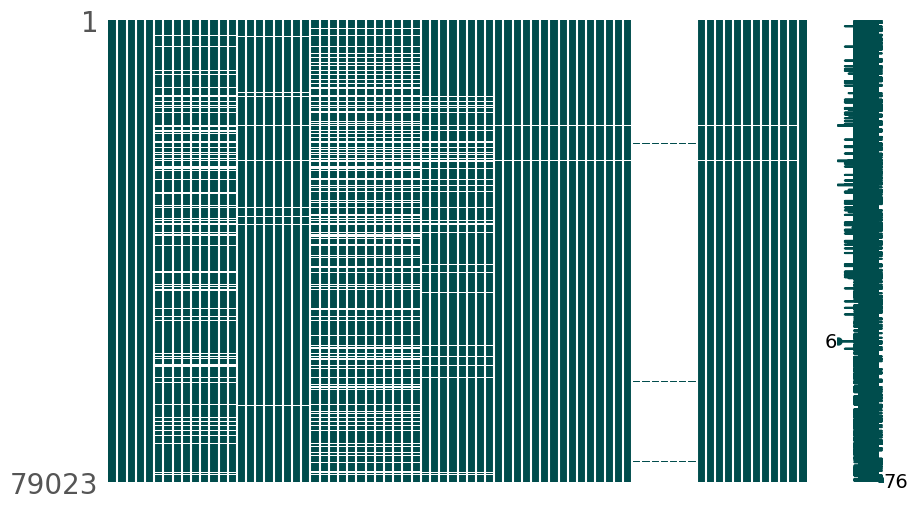

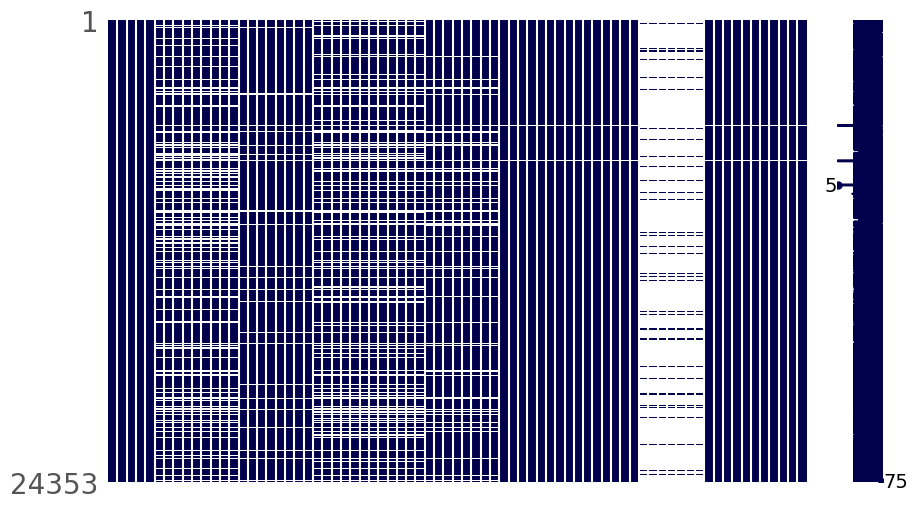

In [25]:
# 欠損値の有無を可視化する
print(msno.matrix(df=train, figsize=(10, 6), color=(0, .3, .3)))
print(msno.matrix(df=test, figsize=(10, 6), color=(0, 0, .3)))

ほとんどのカラムで欠損値が確認された

## 重複データ

In [26]:
total = pd.concat([train.drop('emission', axis=1), test], axis=0) # 目的変数を指定する
total.duplicated().sum()

0

重複データは確認されなかった

## カラムごとのユニークな値を調べる

In [27]:
train[train.columns].nunique().sort_values(ascending=True)

year                                                            3
week_no                                                        53
UvAerosolLayerHeight_sensor_zenith_angle                      433
UvAerosolLayerHeight_sensor_azimuth_angle                     433
UvAerosolLayerHeight_solar_azimuth_angle                      434
UvAerosolLayerHeight_solar_zenith_angle                       436
UvAerosolLayerHeight_aerosol_height                           439
UvAerosolLayerHeight_aerosol_optical_depth                    439
UvAerosolLayerHeight_aerosol_pressure                         439
latitude                                                      452
longitude                                                     453
NitrogenDioxide_sensor_altitude                             55140
NitrogenDioxide_tropopause_pressure                         56556
NitrogenDioxide_cloud_fraction                              59817
NitrogenDioxide_sensor_zenith_angle                         60581
NitrogenDi

### 目的変数

In [28]:
print(target_name +' Class labels:', np.unique(target))

['emission'] Class labels: [0.0000000e+00 3.8178633e-03 3.9780010e-03 ... 3.1360488e+03 3.1366560e+03
 3.1677680e+03]


## データセットのプロット（分布）

### 密度関数（ヒストグラム）

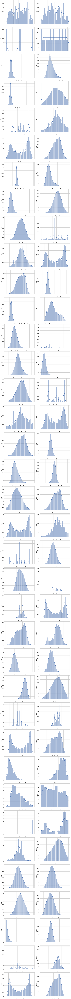

In [29]:
sns.set(style="whitegrid")

rows = (len(numerical_features) + 1) // 2
cols = 2
_, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(8 * cols, 6 * rows))

for i, feature_name in enumerate(numerical_features):
    row_idx, col_idx = divmod(i, cols)
    sns.histplot(data=train, x=feature_name, kde=True, ax=axes[row_idx, col_idx])

plt.tight_layout()

plt.show()

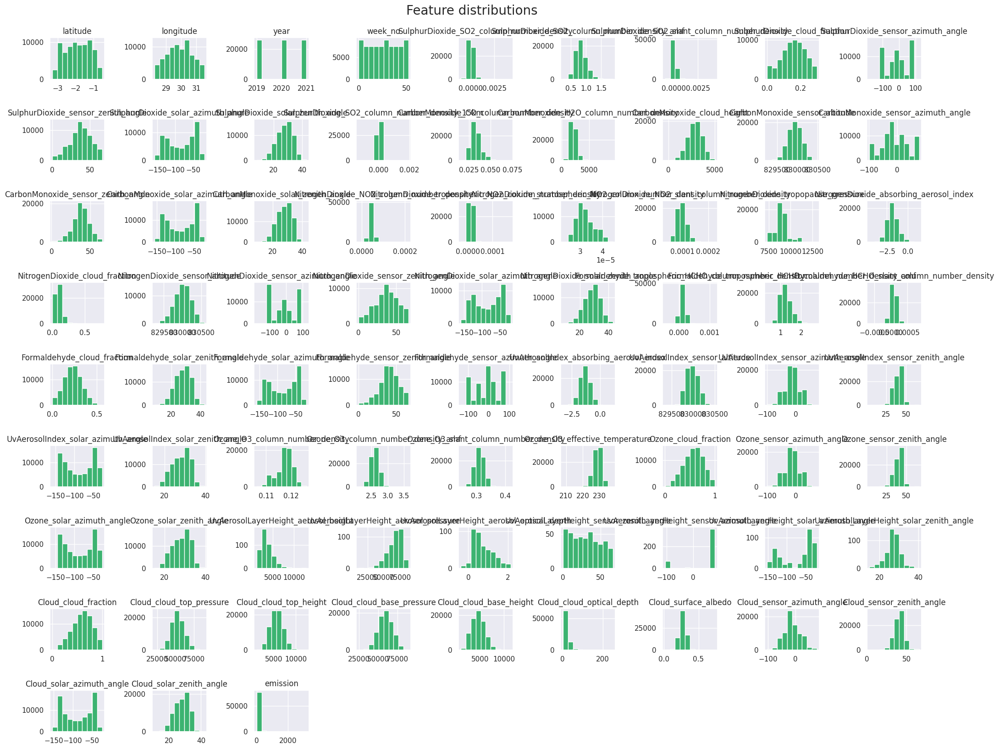

In [30]:
sns.set(rc={'figure.figsize': (20, 16)})
train.hist(color='mediumseagreen')
plt.tight_layout()
plt.suptitle('Feature distributions', y=1.02, fontsize=20)
plt.show()

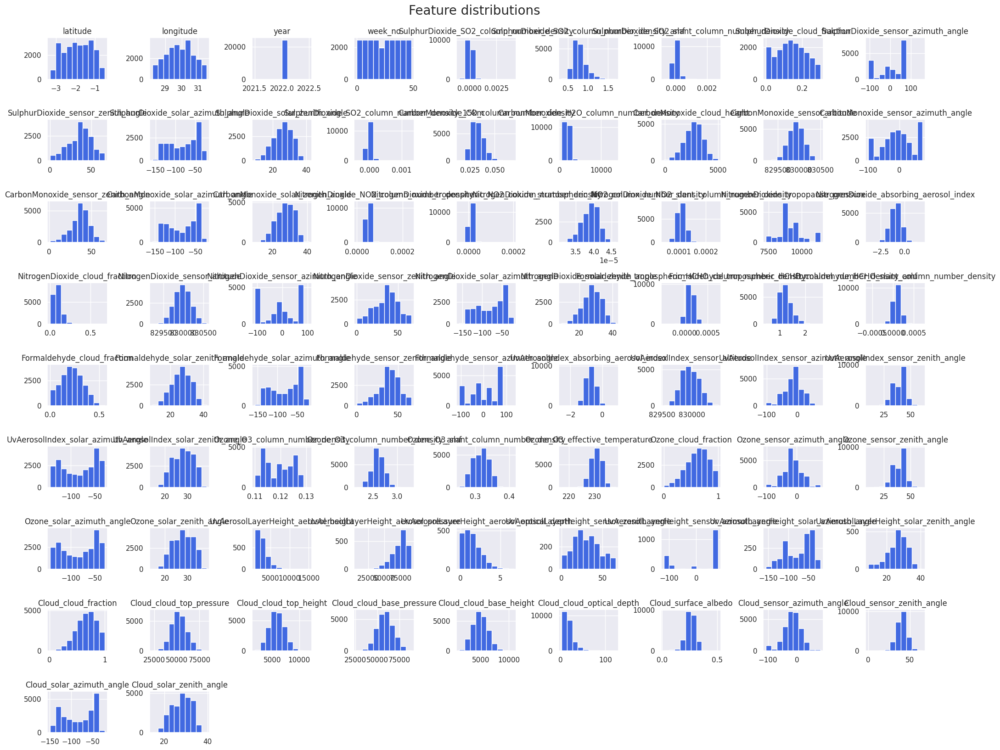

In [31]:
sns.set(rc={'figure.figsize': (20, 16)})
test.hist(color='royalblue')
plt.tight_layout()
plt.suptitle('Feature distributions', y=1.02, fontsize=20)
plt.show()

#### データの分布を可視化する

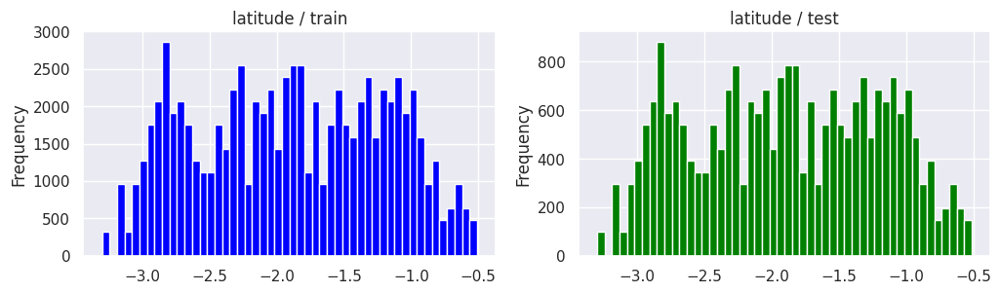

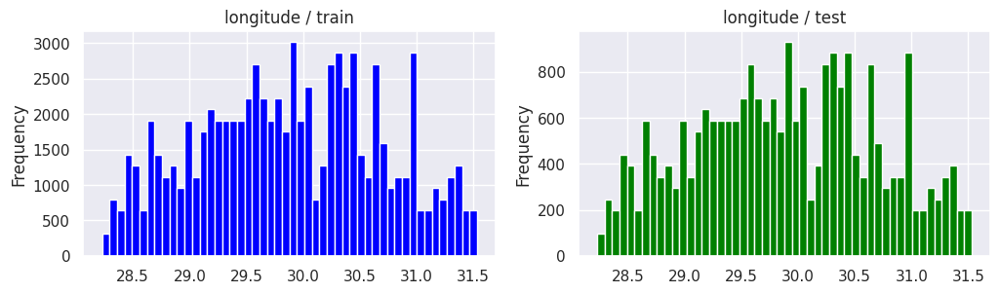

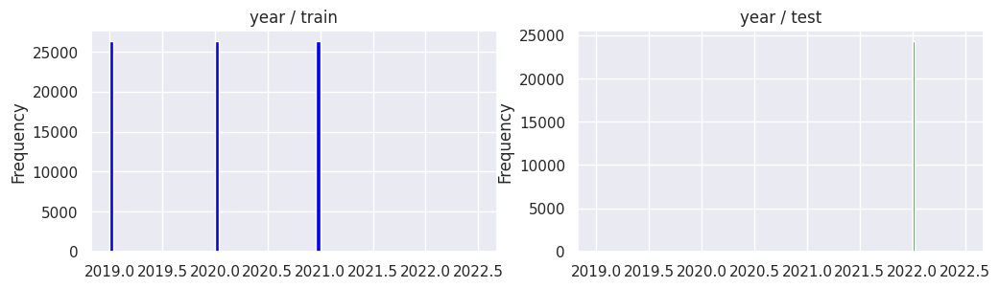

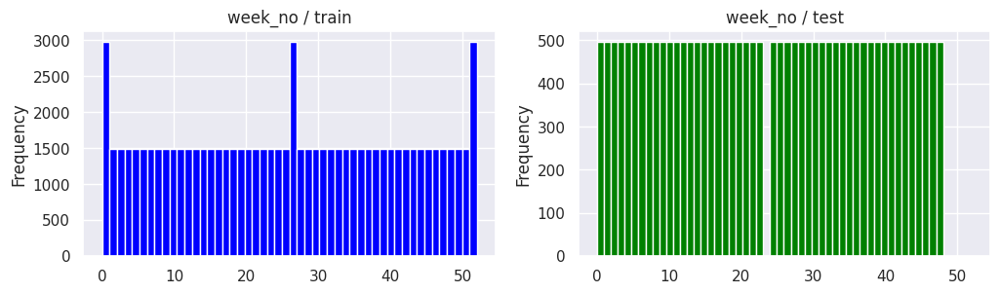

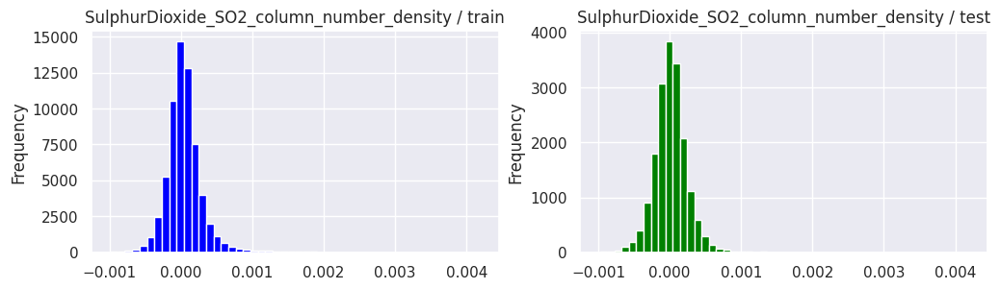

...

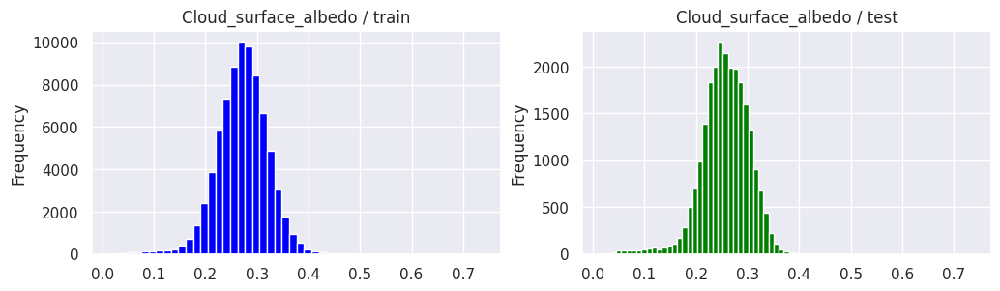

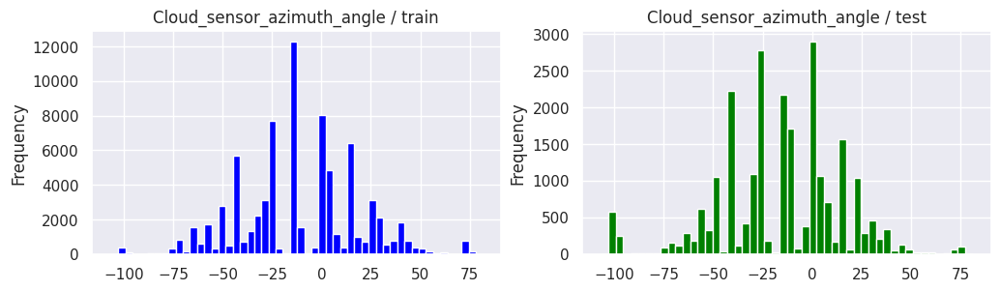

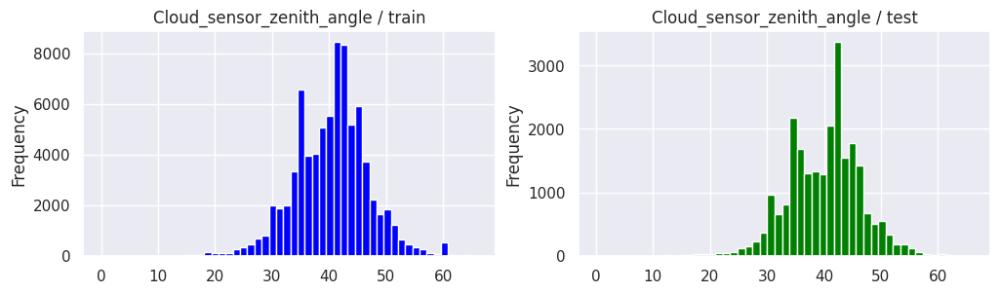

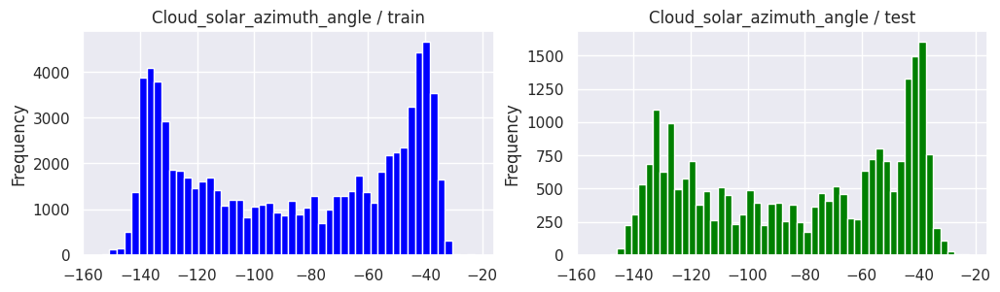

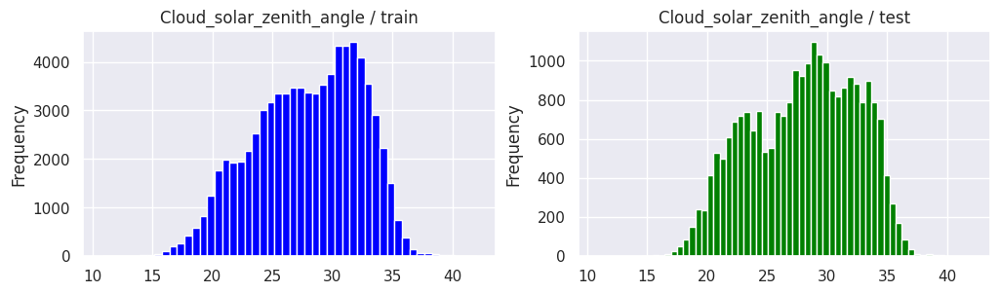

In [32]:
feature = train[numerical_features]

for feat in feature:
    plt.figure(figsize=(12, 3))
    ax1 = plt.subplot(1, 2, 1)
    train[feat].plot(kind='hist', bins=50, color='blue')
    plt.title(feat + ' / train')
    ax2 = plt.subplot(1, 2, 2, sharex=ax1)
    test[feat].plot(kind='hist', bins=50, color='green')
    plt.title(feat + ' / test')

    plt.show()

#### データを対数変換する

In [33]:
# # 訓練データをX(説明変数)とy（目的変数）に分割する
# X = train[numerical_features]
# y = target

# for column in X.columns.tolist():
#     X[column] = X[column].apply(lambda x: np.log(x + 1))

# X.hist(color='mediumseagreen')
# plt.tight_layout()
# plt.suptitle('Feature distributions', y=1.02, fontsize=20)
# plt.show()

In [34]:
# # テストデータも変換する
# test_log = test[numerical_features]
# for column in test_log.columns.tolist():
#     test_log[column] = test_log[column].apply(lambda x: np.log(x + 1))

# test_log.hist(color='royalblue')
# plt.tight_layout()
# plt.suptitle('Feature distributions', y=1.02, fontsize=20)
# plt.show()

数値の範囲がおかしいことになったため断念
- 標準化を行なって分布を確認するのでもいいかもしれない

* 一部の説明変数において分布が確認しやすくなった

##### 数値型の説明変数の分布

カーネル密度推定（KDE: Kernel Density Estimation）
- 実データから、正規分布曲線のように下部の面積が1となるような連続した曲線（確率密度関数）を推定する

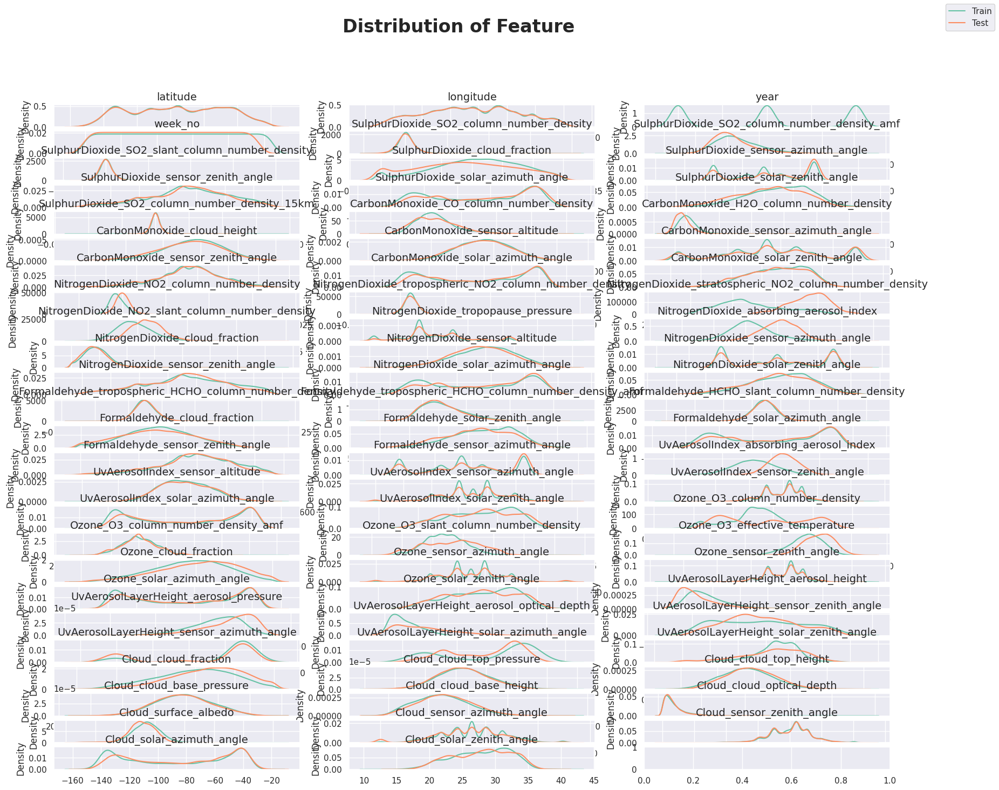

In [35]:
fig, ax = plt.subplots(25, 3)
# fig, ax = plt.subplots(len(numerical_features), 4, figsize=(10, 50))
ax = ax.flatten()
pal2 = sns.color_palette("Set2")
for i, column in enumerate(numerical_features):
    sns.kdeplot(train[column], ax=ax[i], color=pal2[0])
    sns.kdeplot(test[column], ax=ax[i], color=pal2[1], warn_singular=False)

    ax[i].set_title(f'{column}', size=14)
    ax[i].set_xlabel(None)

fig.suptitle('Distribution of Feature', fontsize=24, fontweight='bold')
fig.legend(['Train', 'Test'])
plt.tight_layout()

### 目的変数の数値変数の分布

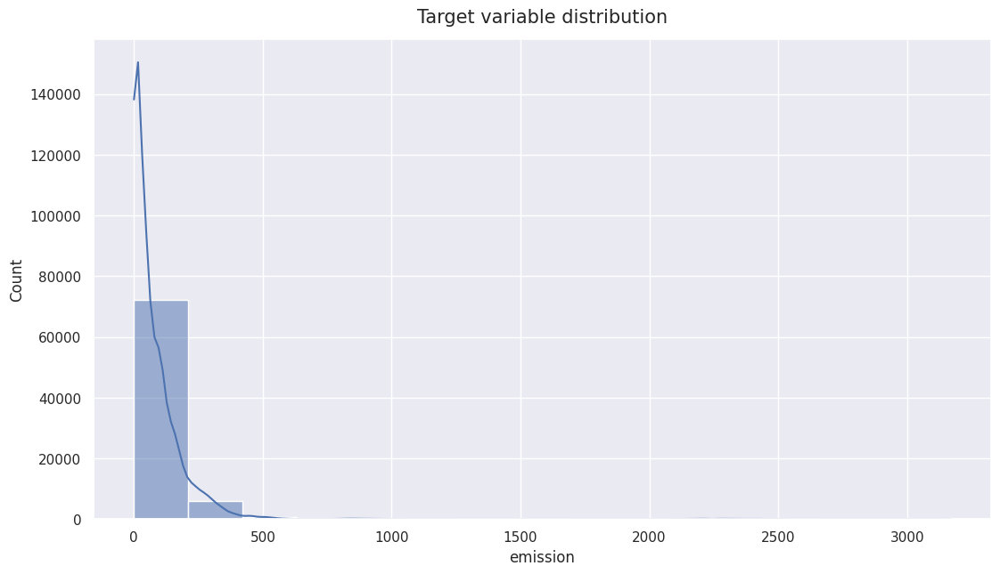

None

10.173825825101622

In [36]:
sns.set_style('darkgrid')
plt.figure(figsize=(13, 7))
sns.histplot(target, kde=True, bins=15)
plt.title('Target variable distribution', y=1.02, fontsize=15)
display(plt.show(), target.skew())

In [ ]:
# 正規分布付きのヒストグラムを描画する
plt.figure(figsize=(9, 8))
sns.distplot(target, color='g', bins=19, hist_kws={'alpha': 0.4}, fit=norm);
# MLE(Maximum Likelihood Estimate)を用いて分布を推定する
(mu, sigma) = norm.fit(target)
print('mu = {:.2f} and sigma = {:.2f}'.format(mu, sigma))
print('※muは、中央値。 sigmaは、分散値')

plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
plt.ylabel('Density')
plt.title('Target distribution')

# QQプロットを描画する
# 正規QQプロットとは、観測値が正規分布に従う場合の期待値をY軸にとり、観測値そのものをX軸にとった確率プロット。
fig = plt.figure()
res = stats.probplot(target, plot=plt)
plt.show()

#### Adversarial Validation(敵対性の検証)

- Adversarial Validation(敵対性の検証)の目的
    - 訓練用のデータセットとテスト用データセットの間で値の分布に差があるかないかを検証すること
- もしもしこの検証の結果得られるROC-AUCスコアが0.5に近いようなら、二つのデータセットは同じ分布を持っていると考えていい
    - しかしその値が0.5から離れているようなら、分布が同様とは言えない

- 信頼できるCV（Cross-validation）スコアは同様の分布を持つデータセットからのみ取得されるため、あらかじめCVスコアが信頼できることを確認しておくためこの検証が必要

In [37]:
# def adversarial_validation(dataset_1=train, dataset_2 = test, label='Train-Test'):
#     adv_train = dataset_1.drop('emission', axis=1) # 目的変数を指定する
#     adv_test = dataset_2.copy()

#     adv_train['is_test'] = 0
#     adv_test['is_test'] = 1

#     adv = pd.concat([adv_train, adv_test], ignore_index=True)
#     adv_shuffled = adv.sample(frac=1)
#     adv_X = adv_shuffled.drop('is_test', axis=1)
#     adv_y = adv_shuffled.is_test

#     skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
#     val_scores = []
#     predictions = np.zeros(len(adv))

#     for fold, (train_idx, val_idx) in enumerate(skf.split(adv_X, adv_y)):
#         adv_lr = make_pipeline(OneHotEncoder(cols=categorical_features), XGBClassifier(random_state=42))
#         adv_lr.fit(adv_X.iloc[train_idx], adv_y.iloc[train_idx])

#         val_preds = adv_lr.predict_proba(adv_X.iloc[val_idx])[:, 1]
#         predictions[val_idx] = val_preds
#         val_score = roc_auc_score(adv_y.iloc[val_idx], val_preds)
#         val_scores.append(val_score)

#     fpr, tpr, _ = roc_curve(adv['is_test'], predictions)

#     plt.figure(figsize=(10, 10), dpi=300)
#     sns.lineplot(x=[0, 1], y=[0, 1], linestyle="--", label="Indistinguishable Datasets")
#     sns.lineplot(x=fpr, y=tpr, label="Adversarial Validation Classifier")
#     plt.title(f'{label} Validation = {np.mean(val_scores):.5f}', weight='bold', size=17)
#     plt.xlabel('False Positive Rate')
#     plt.ylabel('True Positive Rate')
#     plt.show()

# adversarial_validation()

重すぎてクラッシュした

## 円グラフと棒グラフ

##### カテゴリ型変数の分布

In [38]:
# fig, ax = plt.subplots(len(categorical_features), 2, figsize=(10, 50))

# for i, column in enumerate(categorical_features):
#     ax[i][0].pie(
#         train[column].value_counts(),
#         shadow=True,
#         explode=[.1 for i in range(train[column].nunique())],
#         autopct='%1.f%%',
#         textprops={'size': 14, 'color': 'white'}
#     )

#     sns.countplot(data=train, y=column, ax=ax[i][1], palette='viridis', order=train[column].value_counts().index)
#     ax[i][1].yaxis.label.set_size(20)
#     plt.yticks(fontsize=12)
#     ax[i][1].set_xlabel('Count in Train', fontsize=15)
#     ax[i][1].set_ylabel(f'{column}', fontsize=15)
#     plt.xticks(fontsize=12)

# fig.suptitle('Distribution of Categorical Features in Train Dataset \n\n', fontsize = 25, fontweight = 'bold')
# plt.tight_layout()

id　だから無理かも？

In [39]:
# fig, ax = plt.subplots(len(categorical_features), 2, figsize=(10, 50))

# for i, column in enumerate(categorical_features):
#     ax[i][0].pie(
#         test[column].value_counts(),
#         shadow=True,
#         explode=[.1 for i in range(test[column].nunique())],
#         autopct='%1.f%%',
#         textprops={'size': 14, 'color': 'white'}
#     )

#     sns.countplot(data=test, y=column, ax=ax[i][1], palette='viridis', order=test[column].value_counts().index)
#     ax[i][1].yaxis.label.set_size(20)
#     plt.yticks(fontsize=12)
#     ax[i][1].set_xlabel('Count in Test', fontsize=15)
#     ax[i][1].set_ylabel(f'{column}', fontsize=15)
#     plt.xticks(fontsize=12)

# fig.suptitle('Distribution of Categorical Features in Test Dataset \n\n', fontsize = 25, fontweight = 'bold')
# plt.tight_layout()

### 円グラフと棒グラフ（目的変数）

In [ ]:
# fig, ax = plt.subplots(1, 2, figsize=(16, 5))
# ax = ax.flatten()

# ax[0].pie(
#     target.value_counts(),
#     shadow=True,
#     explode=[.1 for i in range(target.nunique())],
#     autopct='%1.f%%',
#     textprops={'size': 14, 'color':'white'}
# )

# sns.countplot(data=train, y=target_col, ax=ax[1], palette='viridis', order=train[target_col].value_counts().index)
# ax[1].yaxis.label.set_size(20)
# plt.yticks(fontsize=12)
# ax[1].set_xlabel('Count', fontsize=20)
# ax[1].set_ylabel(None)
# plt.xticks(fontsize=12)

# fig.suptitle(target_name + ' Distribution in Train Dataset', fontsize=25, fontweight='bold')
# plt.tight_layout()

# # 目的変数を数える
# # print(f'{train[target_col].value_counts()}')

数値変数のため、他の資料を探す

### 箱ひげ図

数値型の説明変数

In [41]:
# for feat in numerical_features:
#     plt.figure(figsize=(12, 4))
#     ax1 = plt.subplot(1, 2, 1)
#     sns.boxplot(data=train, x=target, y=feat)
#     plt.title(target_name + ' vs ' + feat + ' / train')
#     x1 = plt.subplot(1, 2, 2)
#     sns.boxplot(data=test, y=feat)
#     plt.title(feat + ' / test')
#     plt.show()

時間がかかりすぎるため断念（目的変数が数値であるため）

In [ ]:
# df_melted = pd.melt(X[numerical_features])

# custom_colors = px.colors.qualitative.Plotly

# fig = px.box(df_melted, x='variable', y='value', color='variable', color_discrete_sequence=custom_colors)
# fig.update_layout(title='Box Plots')
# fig.show()

#### 箱ひげ図（目的変数）

外れ値を調べる

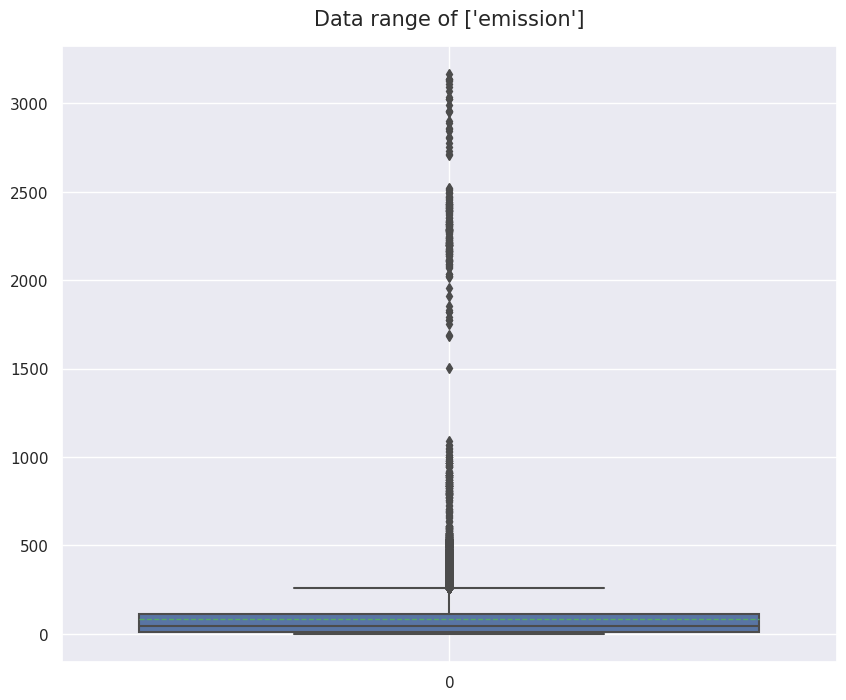

In [43]:
# データの範囲を調べる
plt.figure(figsize=(10, 8))
sns.boxplot(target, showmeans=True, meanline=True)
plt.title('Data range of ' + target_name, y=1.02, fontsize=15)
plt.grid(True)
plt.show()

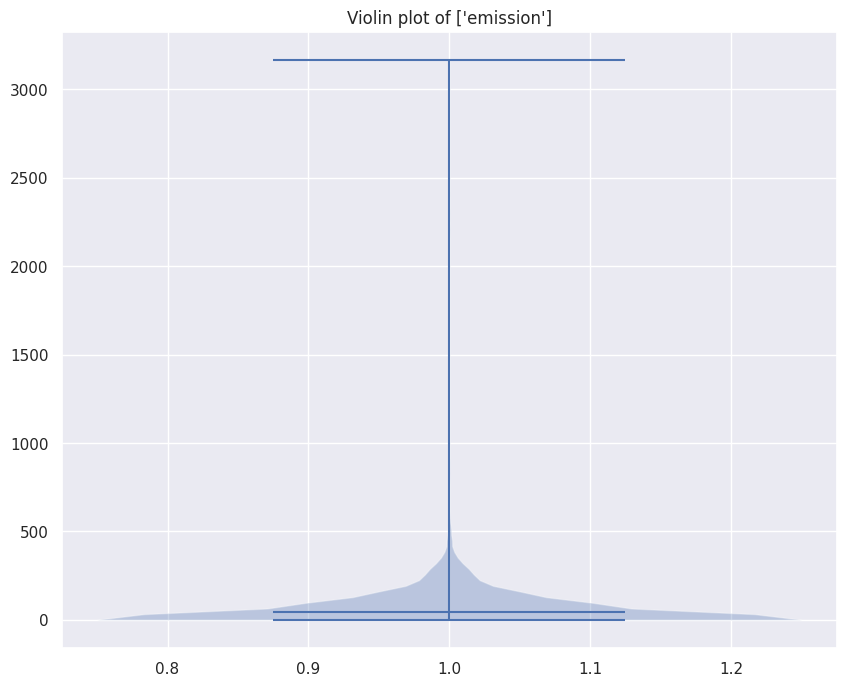

In [44]:
# バイオリンプロット
plt.figure(figsize=(10, 8))
plt.violinplot(target, showmedians=True) # 中央値をマーキングする
plt.title('Violin plot of ' + target_name)
plt.grid(True)

### 特徴量の重要度評価

In [45]:
# %%time

# lgb = LGBMClassifier(
#     random_state=42,
# )

# lgb.fit(X, y)
# importance = lgb.feature_importances_

# feature_importance = pd.DataFrame(data=importance, index=X.columns, columns=['importance']) \
#     .sort_values(ascending=True, by='importance')

# feature_importance.plot(kind='barh', figsize=(10, 15), color='b')

In [46]:
# feature_importance

- 処理を行った後にカテゴリ変数も含めて評価を行う

考察
- lesion_2, lesion_3は重要度が確認されなかった
- 全体的に大きな差がない状態で重要度が確認された

### 相関（ヒートマップ）

<Axes: >

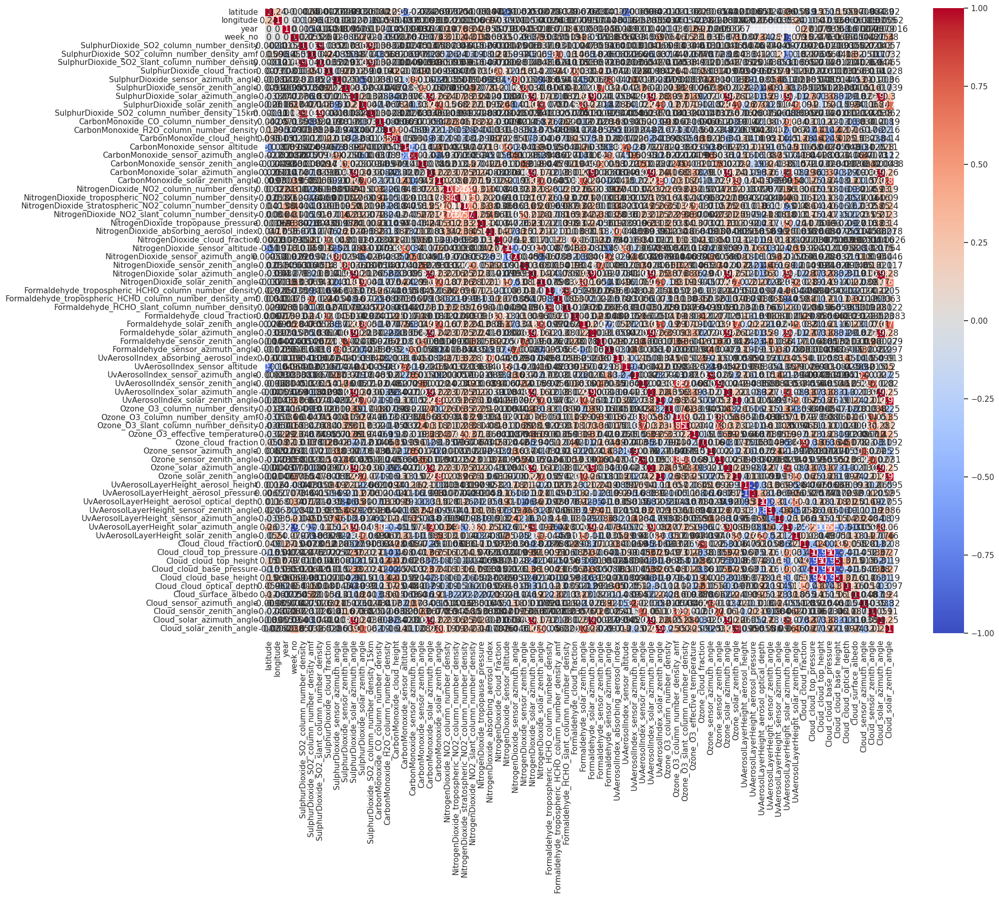

In [47]:
corr = train[numerical_features].corr(method='spearman')
plt.figure()
sns.heatmap(corr, linewidth=0.5, square=False, annot=True, cmap="coolwarm", vmin=-1, vmax=1)

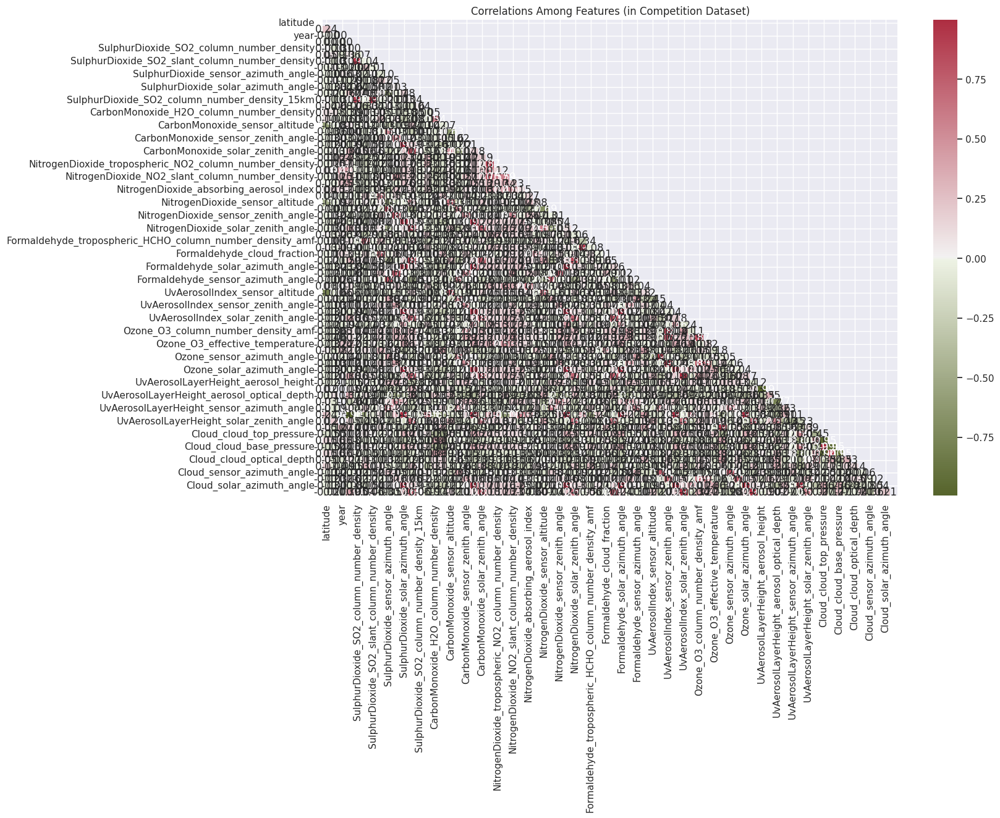

In [48]:
corr_mat_data = train[numerical_features].corr()
data_mask = np.triu(np.ones_like(corr_mat_data, dtype=bool))

cmap = sns.diverging_palette(100, 7, s=75, l=40, n=5, center='light', as_cmap=True)

plt.figure(figsize=(15, 10))
sns.heatmap(corr_mat_data, annot=True, cmap=cmap, fmt='.2f', center=0,
            annot_kws={'size': 12}, mask=data_mask).set_title('Correlations Among Features (in Competition Dataset)');

#### カテゴリ変数をラベルエンコーディングして、相関をプロットする

In [49]:
# train_encoded = train.copy()

# label_encoders = {}
# for column in categorical_features:
#     le = LabelEncoder()
#     train_encoded[column] = le.fit_transform(train[column])
#     label_encoders[column] = le

# # 目的変数がobject型（3水準以上）であるため、ラベルエンコーディングを適用する
# le = LabelEncoder()
# train['outcome_le'] = le.fit_transform(train['outcome'])

# def plot_correlation_heatmap(df: pd.core.frame.DataFrame, title_name: str='Train correlation') -> None:
#     excluded_columns = ['id', 'outcome']
#     columns_without_excluded = [col for col in df.columns if col not in excluded_columns]
#     corr = df[columns_without_excluded].corr()

#     fig, axes = plt.subplots(figsize=(14, 10))
#     mask = np.zeros_like(corr)
#     mask[np.triu_indices_from(mask)] = True
#     sns.heatmap(corr, mask=mask, linewidths=.5, annot=True, annot_kws={"size":6})
#     plt.title(title_name)
#     plt.show()

# plot_correlation_heatmap(train_encoded)

今回は数値型変数になるため、必要ない

#### 目的変数との相関の値が高いカラムについて調べる

In [50]:
# 目的変数との相関の値が高い順に表示する
corr_target_data = train.corr()['emission'] # 目的変数を指定する
corr_target_data.sort_values(ascending=False)

emission                                                    1.00000
longitude                                                   0.10275
UvAerosolLayerHeight_aerosol_height                         0.06901
Cloud_surface_albedo                                        0.04659
Formaldehyde_tropospheric_HCHO_column_number_density_amf    0.04026
UvAerosolLayerHeight_aerosol_optical_depth                  0.04016
UvAerosolLayerHeight_sensor_azimuth_angle                   0.03514
NitrogenDioxide_sensor_altitude                             0.02754
NitrogenDioxide_cloud_fraction                              0.02246
NitrogenDioxide_absorbing_aerosol_index                     0.02091
latitude                                                    0.01785
Ozone_O3_column_number_density                              0.01381
UvAerosolIndex_sensor_azimuth_angle                         0.00830
Ozone_sensor_azimuth_angle                                  0.00777
Cloud_sensor_azimuth_angle                      

In [51]:
# # 'n', 'v', 'b', 'total_Op'とemission(目的変数)との相関関係を調べる
# sns.pairplot(data=train[['n', 'v', 'b', 'total_Op', 'emission']], hue='emission', corner=True);

# あとで実行する

In [52]:
# # 目的変数と最も相関係数が高い説明変数の値ごとのデータ数を数える
# corr_1_size = train.groupby('total_protein').size() # 説明変数を指定する
# corr_1_size.sort_values(ascending=False).head(10)

### 階層的クラスタリング

- 特徴間の関係の強さと方向性を調べる
- 特徴をクラスタリングする

In [54]:
# def distance(data, label = ''):
#     corr = data.corr(method='spearman')
#     dist_linkage = linkage(squareform(1 - abs(corr)), 'complete')

#     plt.figure(figsize=(10, 8))
#     dendro = dendrogram(dist_linkage, labels=data.columns, leaf_rotation=90)
#     plt.title(f'Feature Distance in {label} Dataset', weight='bold', size=20)
#     plt.show()

# distance(train[numerical_features], 'Train')

- テストデータはクラスタリングできなかったため、実施しなかった

考察
- lesion_1と lesion_2, lesion_3は別物と捉えていいと考察した

### 散布図

ペアプロットで近いことをしているため、今回は実施しなかった
- もしかしたら、書籍で全ての変数をプロットする方法が見つかるかもしれないから、それを実行するのもありかも？
- 結構色々な本でやっている。
- でも、負荷が大きい場合はやめる

### その他

### 地理情報を可視化する

In [55]:
train_coords = train.drop_duplicates(subset=['latitude', 'longitude'])
test_coords = test.drop_duplicates(subset=['latitude', 'longitude'])
train_coords['set_type'], test_coords['set_type'] = 'train', 'test'

all_data = pd.concat([train_coords, test_coords], ignore_index=True)

geometry = gpd.points_from_xy(all_data.longitude, all_data.latitude)
geo_df = gpd.GeoDataFrame(
    all_data[["latitude", "longitude", "set_type"]], geometry=geometry
)

geo_df.head()

,latitude,longitude,set_type,geometry
0,-0.51000,29.29000,train,POINT (29.29000 -0.51000)
1,-0.52800,29.47200,train,POINT (29.47200 -0.52800)
2,-0.54700,29.65300,train,POINT (29.65300 -0.54700)
3,-0.56900,30.03100,train,POINT (30.03100 -0.56900)
4,-0.59800,29.10200,train,POINT (29.10200 -0.59800)


In [56]:
all_data_map = folium.Map(perfer_canvas=True)
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in geo_df.geometry]

i = 0
for coordinates in geo_df_list:
    if geo_df.set_type[i] == "train":
        type_color = "green"
    elif geo_df.set_type[i] == "test":
        type_color = "orange"

    all_data_map.add_child(
        folium.CircleMarker(
            location=coordinates,
            radius=1,
            weight=4,
            zoom=10,
            popup="Set: " + str(geo_df.set_type[i]) + "<br>"
            "Coordinates: " + str([round(x, 2) for x in geo_df_list[i]]),
            color=type_color),
    )
    i = i + 1

all_data_map.fit_bounds(all_data_map.get_bounds())
all_data_map

### 時系列データ

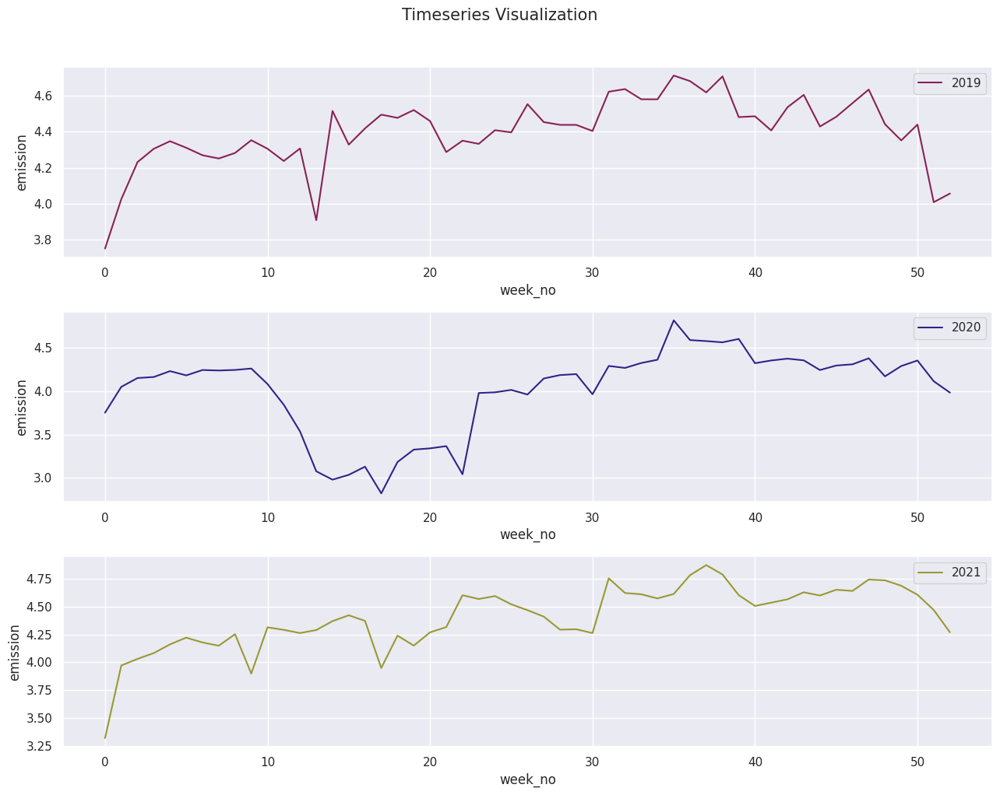

In [57]:
train.latitude, train.longitude = round(train.latitude, 2), round(train.longitude, 2)
sample_loc = train[(train.latitude == -0.510) & (train.longitude == 29.290)]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(13, 10))
fig.suptitle('Timeseries Visualization', y=1.02, fontsize=15)

for ax, data, year, color, in zip(axes.flatten(), sample_loc, sample_loc.year.unique(),  ['#882255','#332288', '#999933' , 'orangered']):
    df = sample_loc[sample_loc.year == year]
    sns.lineplot(x=df.week_no, y=df.emission, # 変数を指定する
                 ax=ax,
                 label=year,
                 color=color)

plt.legend()
plt.tight_layout()

#### 目的変数に関わるもの

## EDAの可視化するためのライブラリ

### sweetviz

In [ ]:
report = sv.compare([train, "Train"], [test, "Test"], target_feat='emission') # 目的変数を指定する
report.show_html(OUTPUT_DIR + "/EDA_sweetviz.html")

## 実行時間を調べるために使う

In [ ]:
end_time = time.time()
lap = end_time - start_time
indi_time = changeHMS(lap)
indi_time